<a href="https://colab.research.google.com/github/CodeofRahul/Image_Captioning_Project/blob/main/Image_Captioning_Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Image to Text Generation using `blip-image-captioning-base`**

## **1. What is Image Captioning?**

- **Image Captioning:** The process of generating a descriptive text (caption) from an image.

- Uses both **vision models** and **natural language models** to analyze and describe visual content.

## **2. About `blip-image-captioning-base`**

- **BLIP:** Stands for Bootstrapping Language-Image Pre-training.

- A pre-trained model designed by Salesforce for **image captioning** and other vision-language tasks.

- Combines **Vision Transformers (ViT)** with language models to produce captions.

## **3. Key Features**

- **Multi-modal learning:** Learns from both images (vision) and text (language).

- **Fine-tuned** for image captioning, creating coherent and context-aware captions.

- Can be used in tasks like **alt text generation, content categorization**, and **image search**.

## **4. Example Workflow**

**1. Input:** An image is passed to the model.

**2. Processing:** Visual features are extracted by the model’s vision encoder.

**3. Output:** The language model generates a descriptive caption.

## **5. Practical Applications**

- **Accessibility:** Automatically generates alt text for images.

- **Search Engines:** Improves image indexing by generating relevant descriptions.

- **Content Moderation:** Describes the content of images for filtering or categorizing.

## **6. Model Workflow**

- **Vision Encoding:** Uses a Vision Transformer (ViT) to process the image.

- **Language Decoding:** Uses a transformer-based model to generate the caption.

- **End-to-End Process:** Combines both vision and language understanding for accurate descriptions.

## **7. Example Use Case**

- **Input:** Image of a dog playing with a ball.

- **Output:** Caption: "A dog playing with a ball on the grass."

BLIP (Bootstrapping Language-Image Pre-training) Docs: https://huggingface.co/docs/transformers/model_doc/blip

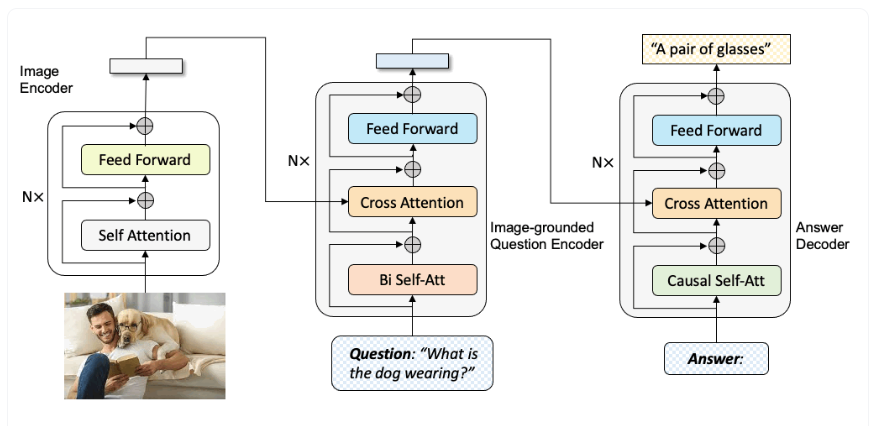

In [1]:
!pip install transformers torch pillow accelerate

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 1.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 70.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 57.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 41.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 4.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 9.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 8.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 4.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 30.1 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalling nvidia-nvjitlink-cu12-12.5.82:
      Successfully uninstalled nvidia-nvjitlink

In [4]:
from transformers import BlipProcessor, BlipForConditionalGeneration

In [5]:
# Load model and processor

processor = BlipProcessor.from_pretrained("Salesforce/blip-image-captioning-base")
model = BlipForConditionalGeneration.from_pretrained("Salesforce/blip-image-captioning-base")

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:104: UserWarning: 
Error while fetching `HF_TOKEN` secret value from your vault: 'Requesting secret HF_TOKEN timed out. Secrets can only be fetched when running from the Colab UI.'.
You are not authenticated with the Hugging Face Hub in this notebook.
If the error persists, please let us know by opening an issue on GitHub (https://github.com/huggingface/huggingface_hub/issues/new).
  warnings.warn(


preprocessor_config.json:   0%|          | 0.00/287 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/506 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/711k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/125 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/4.56k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/990M [00:00<?, ?B/s]

In [7]:
# Load image

from PIL import Image


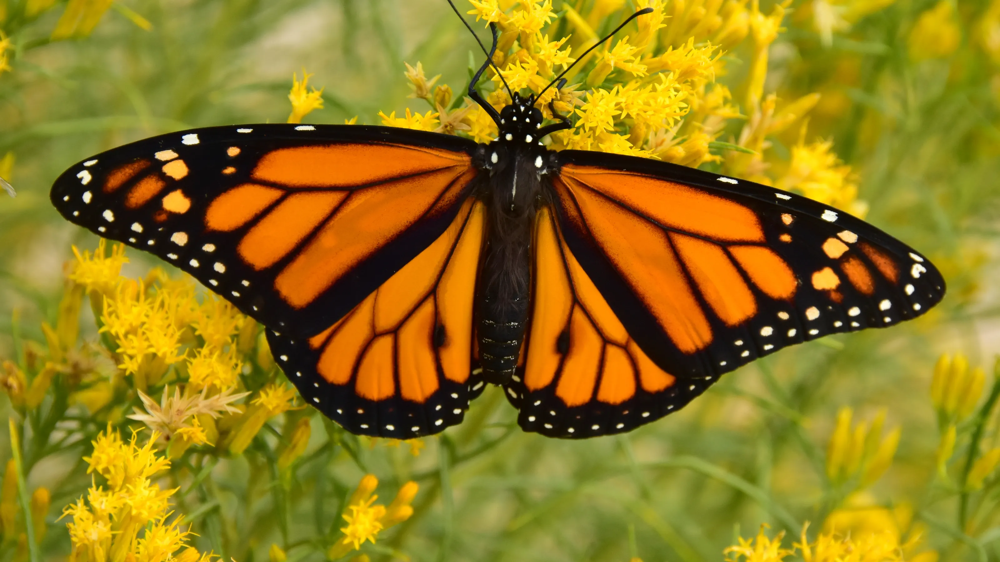

In [15]:
Image.open("/content/butterfly.webp")

In [9]:
image = Image.open("/content/butterfly.webp")

In [10]:
# Prepare inputs
inputs = processor(image, return_tensors='pt')    # 'pt' refers to PyTorch tensor

In [11]:
# Generate caption

out = model.generate(**inputs)
caption = processor.decode(out[0], skip_special_tokens=True)

In [12]:
print(f"Generated caption: {caption}")

Generated caption: a monarch butterfly on a yellow flower


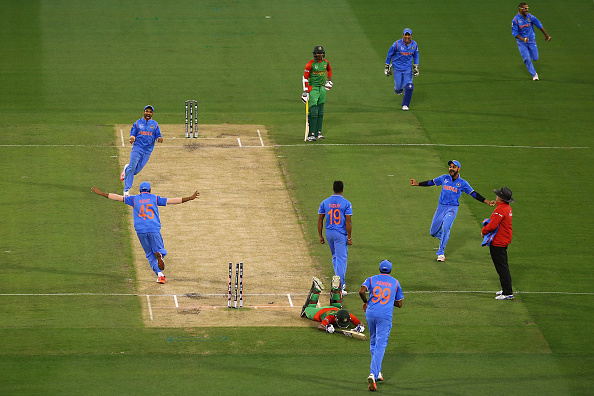

In [16]:
Image.open("/content/cricket_image.jpeg")

In [17]:
cri_image = Image.open("/content/cricket_image.jpeg")

In [19]:
# prepare inputs
inputs = processor(cri_image, return_tensors='pt')

In [20]:
out = model.generate(**inputs)
caption = processor.decode(out[0], skip_special_tokens=True)

In [21]:
print(f"Generated caption is : {caption}")

Generated caption is : a group of men playing a game of cricket


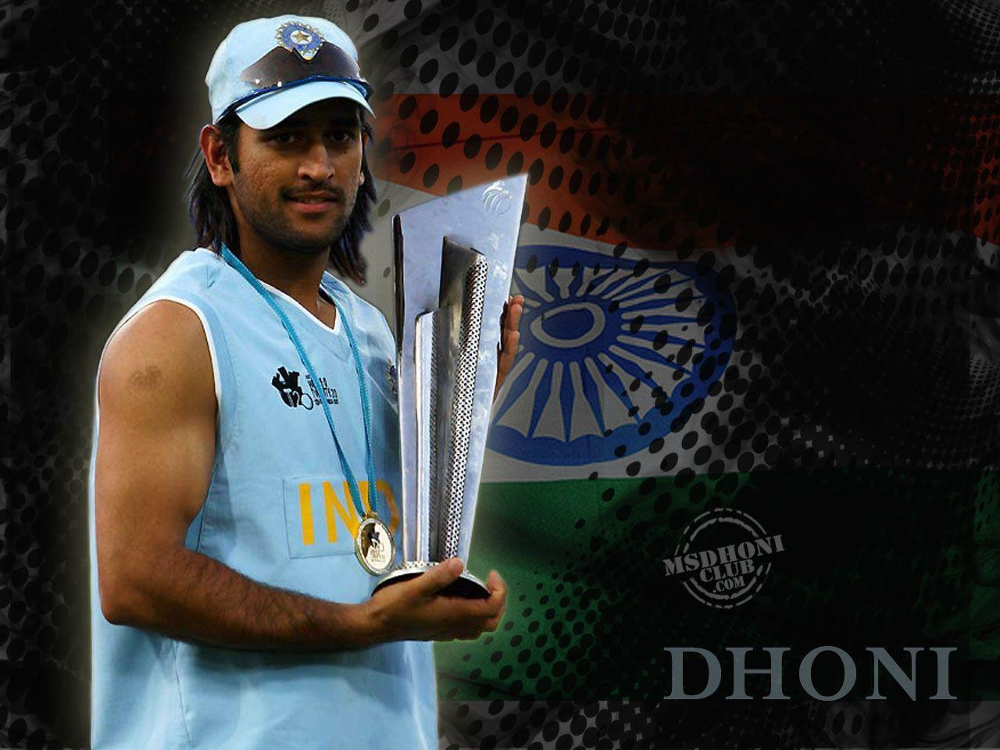

In [22]:
Image.open("/content/Dhoni.jpg")

In [23]:
ms_image = Image.open("/content/Dhoni.jpg")

In [24]:
# prepare inputs

inputs = processor(ms_image, return_tensors = 'pt')

In [25]:
# Generate caption

out = model.generate(**inputs)
caption = processor.decode(out[0], skip_special_tokens=True)

In [26]:
print(f"Generated caption : {caption}")

Generated caption : a man holding a trophy in front of a flag
